In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

## 1. Log Data 

### 1-1. Log Data Setting

In [147]:
directory = '../data/logdata/2612/'
file_list = os.listdir(directory)
file_list

['01.20221201-2612-S-05-0000001.TXT.LF.TXT.csv',
 '02.20221202-2612-S-08-0000001.TXT.LF.TXT.csv',
 '03.20221203-2612-S-10-0000001.TXT.LF.TXT.csv',
 '04.20221204-2612-S-11-0000001.TXT.LF.TXT.csv',
 '05.20221205-2612-S-01-0000001.TXT.LF.TXT.csv',
 '06.20221206-2612-S-02-0000001.TXT.LF.TXT.csv',
 '07.20221207-2612-S-03-0000001.TXT.LF.TXT.csv',
 '08.20221208-2612-S-05-0000001.TXT.LF.TXT.csv',
 '09.20221209-2612-S-07-0000001.TXT.LF.TXT.csv',
 '10.20221210-2612-S-01-0000001.TXT.LF.TXT.csv',
 '11.20221211-2612-S-02-0000001.TXT.LF.TXT.csv',
 '12.20221212-2612-S-05-0000001.TXT.LF.TXT.csv',
 '13.20221213-2612-S-06-0000001.TXT.LF.TXT.csv',
 '14.20221214-2612-S-07-0000001.TXT.LF.TXT.csv']

In [148]:
gdf = []
for log in file_list[:]:
    directory = directory + log 
    gdf.append(pd.read_csv(directory, encoding='cp949'))
    directory = '../data/logdata/2612/'
gdf[0].columns


Index(['date', 'model_name', 'car_type', 'car_num', 'business_num',
       'driver_code', 'daily_distance', 'cum_distance', 'information_date',
       'car_speed', 'RPM', 'brake_signal', 'car_location_GPS_X',
       'car_location_GPS_Y', 'Global_Positioning_System_GPS_azimuth',
       'accelerationVx', 'accelerationVy', 'status_code'],
      dtype='object')

In [149]:
gdf[6].tail()

,date,model_name,car_type,car_num,business_num,driver_code,daily_distance,cum_distance,information_date,car_speed,RPM,brake_signal,car_location_GPS_X,car_location_GPS_Y,Global_Positioning_System_GPS_azimuth,accelerationVx,accelerationVy,status_code
13524,20221207,EDTG-100A,11,2612,NaN,10000001,44,2022796,22120811104300,0,568,0,129157966,35236346,335,7.1,0.1,0
13525,20221207,EDTG-100A,11,2612,NaN,10000001,44,2022796,22120811104400,0,573,0,129157966,35236346,335,7.6,0.1,0
13526,20221207,EDTG-100A,11,2612,NaN,10000001,44,2022796,22120811104500,0,571,0,129157966,35236346,335,7.7,0.1,0
13527,20221207,EDTG-100A,11,2612,NaN,10000001,44,2022796,22120811104600,0,571,0,129157966,35236346,335,7.9,0.1,0
13528,20221207,EDTG-100A,11,2612,NaN,10000001,44,2022796,22120811104700,0,136,0,129157966,35236346,335,7.9,0.1,0


### 1-2. Log Data Analysis

#### 1-2-1. Distanse and Speed and Location Correlation

In [90]:
edf = gdf[0][['cum_distance','car_speed','car_location_GPS_X','car_location_GPS_Y','Global_Positioning_System_GPS_azimuth','accelerationVx','accelerationVy']]
edf.head()

,cum_distance,car_speed,car_location_GPS_X,car_location_GPS_Y,Global_Positioning_System_GPS_azimuth,accelerationVx,accelerationVy
0,3093066,0,129158634,35236121,63,-5.8,-1.3
1,3093066,0,129158634,35236121,63,-7.8,-5.0
2,3093066,0,129158634,35236121,63,-6.9,-3.8
3,3093066,0,129158634,35236121,63,-5.9,-1.2
4,3093066,0,129158634,35236121,63,-5.8,-1.1


In [91]:
edf.corr()

,cum_distance,car_speed,car_location_GPS_X,car_location_GPS_Y,Global_Positioning_System_GPS_azimuth,accelerationVx,accelerationVy
cum_distance,1.000000,0.106420,0.010629,-0.156592,0.050910,-0.110948,-0.137931
car_speed,0.106420,1.000000,-0.170894,0.059567,-0.005973,-0.601230,-0.408850
car_location_GPS_X,0.010629,-0.170894,1.000000,-0.431244,-0.011746,0.153946,0.092151
car_location_GPS_Y,-0.156592,0.059567,-0.431244,1.000000,-0.183090,-0.055826,-0.012123
Global_Positioning_System_GPS_azimuth,0.050910,-0.005973,-0.011746,-0.183090,1.000000,-0.069143,-0.006933
accelerationVx,-0.110948,-0.601230,0.153946,-0.055826,-0.069143,1.000000,0.350041
accelerationVy,-0.137931,-0.408850,0.092151,-0.012123,-0.006933,0.350041,1.000000


<AxesSubplot:>

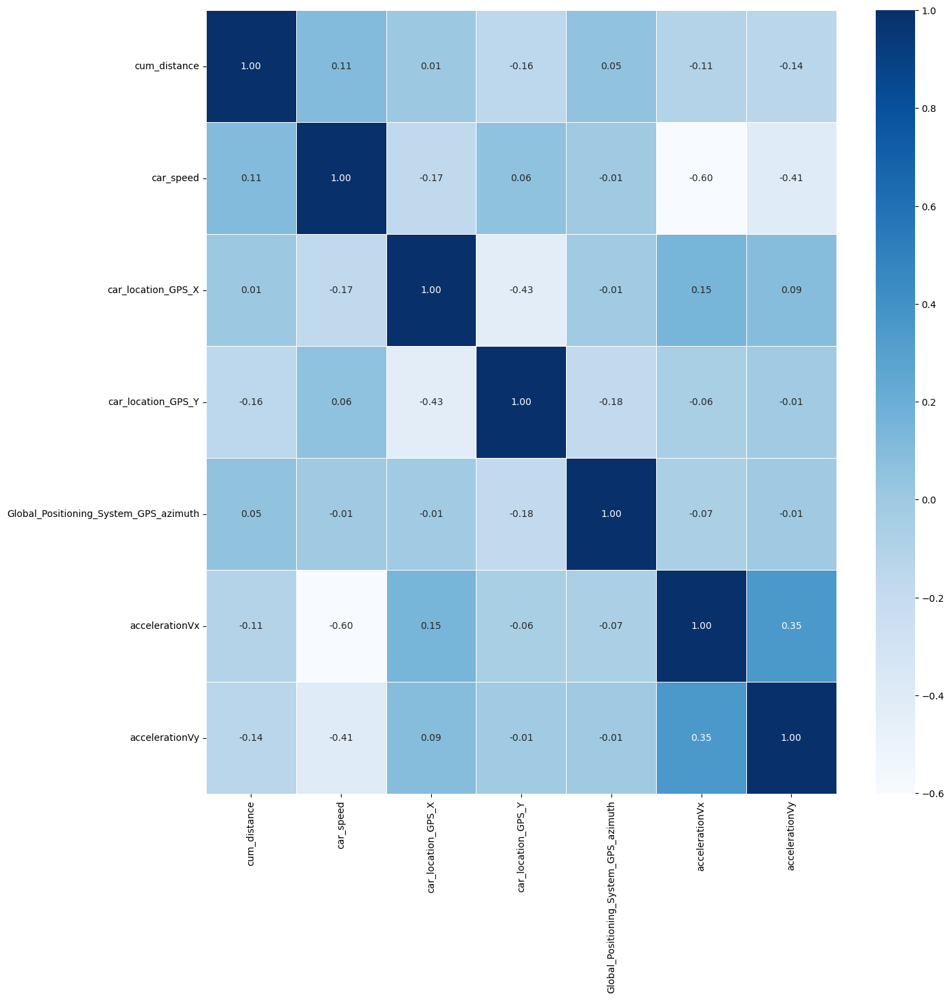

In [92]:
plt.figure(figsize=(15,15))
sns.heatmap(data = edf.corr(), annot = True, fmt = '.2f', linewidths=.5, cmap='Blues')

#### 1-2-2. Speed, Vehicle and Distanse Correlation 

In [93]:
vdf = gdf[0][['daily_distance', 'cum_distance','car_speed', 'RPM', 'brake_signal','status_code']]
vdf.head()

,daily_distance,cum_distance,car_speed,RPM,brake_signal,status_code
0,44,3093066,0,197,0,0
1,44,3093066,0,605,0,0
2,44,3093066,0,776,0,0
3,44,3093066,0,636,0,0
4,44,3093066,0,577,0,0


In [94]:
vdf.corr()

,daily_distance,cum_distance,car_speed,RPM,brake_signal,status_code
daily_distance,1.000000,0.999221,0.108355,0.095050,0.051459,0.007754
cum_distance,0.999221,1.000000,0.106420,0.094286,0.049038,0.007414
car_speed,0.108355,0.106420,1.000000,0.821807,-0.244641,-0.010758
RPM,0.095050,0.094286,0.821807,1.000000,-0.336956,0.052569
brake_signal,0.051459,0.049038,-0.244641,-0.336956,1.000000,-0.055126
status_code,0.007754,0.007414,-0.010758,0.052569,-0.055126,1.000000


<AxesSubplot:>

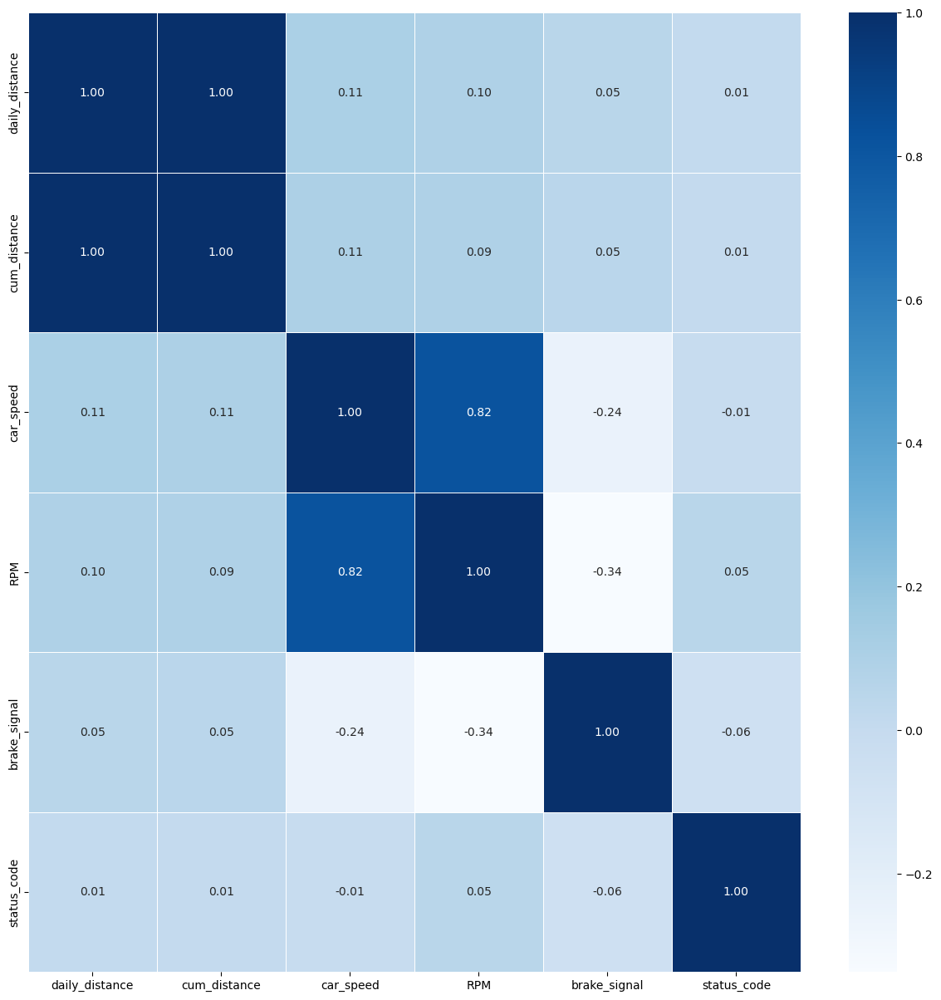

In [95]:
plt.figure(figsize=(15,15))
sns.heatmap(data = vdf.corr(), annot = True, fmt = '.2f', linewidths=.5, cmap='Blues')

#### 1-2-3. Speed Pattern Analysis

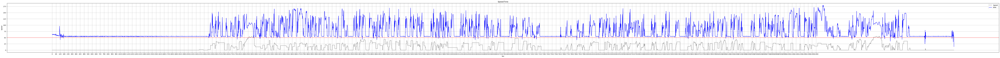

In [151]:
x = np.arange(0,len(gdf[7]), 60)
plt.figure(figsize=(120,6))
plt.plot(gdf[6]['car_speed'], label='Speed', color='Grey')
plt.plot((gdf[6]['RPM']/10), label='RPM', color='Blue')
plt.title('Speed/Time')            
plt.xlabel('Sec')                            
plt.ylabel('Speed')                      
plt.xticks(x)
plt.axhline(y=50, color='r', linewidth=1)                                
plt.grid(visible=True)
plt.legend()
plt.show()

In [ ]:
plt.figure(figsize=(120,6))
plt.plot(gdf[7]['car_speed'], label='1201_CS', color='Grey')
plt.title('Speed/Time')            
plt.xlabel('Sec')                            
plt.ylabel('Speed')                      
plt.xticks(x)                                
plt.grid(visible=True)
plt.legend()
plt.show()

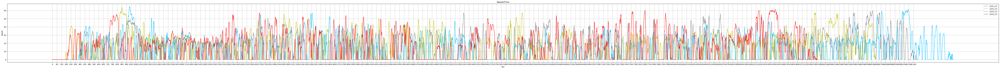

In [100]:
# Speed's Graph
x = np.arange(0,len(gdf[0]),60)
plt.figure(figsize=(100,6))
plt.plot(gdf[0]['car_speed'], label='1201_CS', color='Grey')
plt.plot(gdf[1]['car_speed'], label='1202_CS', color='y')
plt.plot(gdf[2]['car_speed'], label='1203_CS', color='deepskyblue')
plt.plot(gdf[3]['car_speed'], label='1204_CS', color='r')        
plt.title('Speed/Time')            
plt.xlabel('Sec')                            
plt.ylabel('Speed')                      
plt.xticks(x)                                
plt.grid(visible=True)
plt.legend()
plt.show()

#### 1-2-4. GPS Azimuth Analysis

In [ ]:
# 출발시간 맞춤 - 정규화
gdf[0] = gdf[0][367:]
gdf[1] = gdf[1][173:]
gdf[2] = gdf[2][340:]
gdf[0] = gdf[0].reset_index()
gdf[1] = gdf[1].reset_index()
gdf[2] = gdf[2].reset_index()

In [ ]:
gdf[0][['date','Global_Positioning_System_GPS_azimuth']]

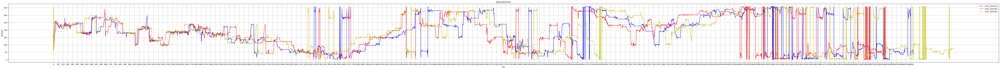

In [41]:
# 유사한 패턴 확인
x = np.arange(0,len(gdf[0]),60)
plt.figure(figsize=(100,6))
plt.plot(gdf[0]['Global_Positioning_System_GPS_azimuth'], label='1201_Azimuth', color='b')
plt.plot(gdf[1]['Global_Positioning_System_GPS_azimuth'], label='1202_Azimuth', color='r')
plt.plot(gdf[2]['Global_Positioning_System_GPS_azimuth'], label='1203_Azimuth', color='y')          
plt.title('Azimuth/Time')            
plt.xlabel('Sec')                            
plt.ylabel('Azimuth')                      
plt.xticks(x)                                
plt.grid(visible=True)
plt.legend()
plt.show()

#### 1-2-5. RPM Analysis

In [20]:
gdf[0]['RPM']

0        197
1        605
2        776
3        636
4        577
        ... 
11202      0
11203      0
11204      0
11205      0
11206      0
Name: RPM, Length: 11207, dtype: int64

In [102]:
x = np.arange(0,len(gdf[0]),60)
plt.figure(figsize=(120,6))
plt.plot(gdf[0]['RPM'], label='RPM', color='r')
plt.title('RPM/Time')            
plt.xlabel('Sec')                            
plt.ylabel('RPM')                      
plt.xticks(x)                                
plt.grid(visible=True)
plt.legend()
plt.show()

## 2. Processing Data

In [131]:
car_name = '9582'
dt = '../data/prodata_u/'
prod_list = os.listdir(dt+car_name)
prod_list


['01.20221201-9582-ProData.csv',
 '02.20221202-9582-ProData.csv',
 '03.20221203-9582-ProData.csv',
 '04.20221204-9582-ProData.csv',
 '05.20221205-9582-ProData.csv',
 '06.20221206-9582-ProData.csv',
 '07.20221207-9582-ProData.csv',
 '08.20221208-9582-ProData.csv',
 '09.20221209-9582-ProData.csv',
 '10.20221210-9582-ProData.csv',
 '11.20221211-9582-ProData.csv',
 '12.20221212-9582-ProData.csv',
 '13.20221213-9582-ProData.csv',
 '14.20221214-9582-ProData.csv']

In [132]:
pros = []
for pl in prod_list[:]:
    pros.append(pd.read_csv(dt+car_name+'/'+pl, encoding='cp949'))

In [133]:
pros[1].tail()

,date,car_num,brake_signal,RPMS,ACC,FS,RPMSR,ACCR,SRA
11240,20221202,9582,0,-102,0,0,0,0,0
11241,20221202,9582,0,0,0,0,0,0,0
11242,20221202,9582,0,0,0,0,0,0,0
11243,20221202,9582,0,0,0,0,0,0,0
11244,20221202,9582,0,0,0,0,0,0,0


### 2-1.Processing DataFrame Setting

In [ ]:
prodata = []
for n in range(0,len(gdf),1):
    prodata.append(gdf[n][['date','car_num','brake_signal']])
    #RPMS = RPMSlops(RPM 변화량)
    prodata[n]['RPMS'] = 0
    for j in range(1,len(prodata[n])-1,1):
        prodata[n]['RPMS'][j] = (gdf[n]['RPM'][j] - gdf[n]['RPM'][j-1])
    #ACC = ACCeleration(가속도)
    prodata[n]['ACC'] = 0
    for i in range(1,len(prodata[n])-1,1):
        prodata[n]['ACC'][i] = (gdf[n]['car_speed'][i] - gdf[n]['car_speed'][i-1])
    #FS = fast speed(과속)
    prodata[n]['FS'] = np.where(gdf[n]['car_speed'] > 50, 1, 0)
    #RPMSR = RPMSlops Rapid(급격한 RPM 변화 - 변화없음 : 0, + 변화량 : 1, - 변화량 : 2)
    prodata[n]['RPMSR'] = np.where(prodata[n]['RPMS'] > 350, 1, np.where(prodata[n]['RPMS'] < -350, 2, 0))
    #ACCR = ACCeleration Rapid(급격한 가속도 변화량 - 변화없음 : 0, + 변화량 : 1, - 변화량 : 2)
    prodata[n]['ACCR'] = np.where(prodata[n]['ACC'] >= 6, 4, np.where(prodata[n]['ACC'] <= -9, 7, 0))
    #SRA = prodata[n]['RPMSR'] + prodata[n]['ACCR']
    prodata[n]['SRA'] = prodata[n]['RPMSR'] + prodata[n]['ACCR']

    protitle = file_list[n][:17] + 'ProData.csv'
    prodata[n].to_csv(protitle ,mode='w' ,index=False)
    protitle = ''


In [75]:
prodata[2].tail()

,date,car_num,brake_signal,RPMS,ACC,FS,RPMSR,ACCR,SRA
11365,20221203,9582,0,0.0,0.0,0,0,0,0
11366,20221203,9582,0,0.0,0.0,0,0,0,0
11367,20221203,9582,0,0.0,0.0,0,0,0,0
11368,20221203,9582,0,0.0,0.0,0,0,0,0
11369,20221203,9582,0,0.0,0.0,0,0,0,0


In [67]:
prod = []
dire = '../data/prodata/'
fili = os.listdir(dire)
for pro in fili[:]:
    dire = dire + pro
    prod.append(pd.read_csv(dire, encoding='cp949'))
    dire = '../data/prodata/'
prod[0].tail()

,date,car_num,brake_signal,RPMS,ACC,FS,RPMSR,ACCR,SRA
11202,20221201,2612,0,0.0,0.0,0,0,0,0
11203,20221201,2612,0,0.0,0.0,0,0,0,0
11204,20221201,2612,0,0.0,0.0,0,0,0,0
11205,20221201,2612,0,0.0,0.0,0,0,0,0
11206,20221201,2612,0,0.0,0.0,0,0,0,0


### 2-2. Processing Data Analysis

#### 2-2-1.Processing Data Visual analysis

In [175]:
dnum = 6

In [ ]:
bs = prod[dnum]['brake_signal'] * 100
bs

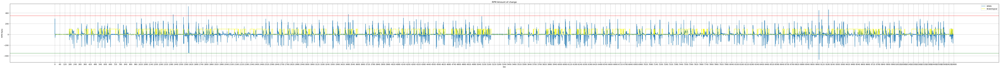

In [18]:
# RPM Amount of Change's Graph
x = np.arange(0,len(prod[dnum]),60)
plt.figure(figsize=(100,6))
plt.plot(prod[dnum]['RPMS'], label='RPMS')      
plt.plot(bs, color='yellow', label='BrakeSignal')
plt.title('RPM Amount of change')            
plt.xlabel('Sec')                            
plt.ylabel('RPM Ratio')                      
plt.xticks(x)                                
plt.grid(visible=True)
plt.axhline(y=350, color='r', linewidth=1)
plt.axhline(y=-350, color='g', linewidth=1)
plt.legend()
plt.show()

In [83]:
# RPM Amount of Change's Average 
aacc = prod[dnum]['ACC'].mean()
aacc

0.0

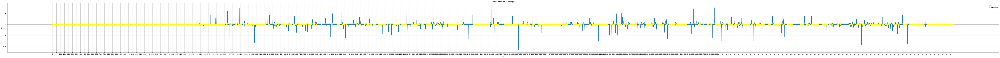

In [185]:
# Acceleration Amount of Change's Graph
x = np.arange(0,len(prod[dnum]),60)
plt.figure(figsize=(120,6))
plt.plot(prod[dnum]['ACC'], label='ACC')        
plt.plot(prod[dnum]['brake_signal'], color='yellow', label='BrakeSignal')
plt.title('Speed Amount of change')          
plt.xlabel('Sec')                            
plt.ylabel('ACC')                            
plt.xticks(x)                               
plt.grid(visible=True)
plt.axhline(y=4, color='r', linewidth=1)
plt.axhline(y=-4, color='g', linewidth=1)
plt.legend()
plt.show()

In [48]:
acc = prod[dnum]['ACC'] * 100

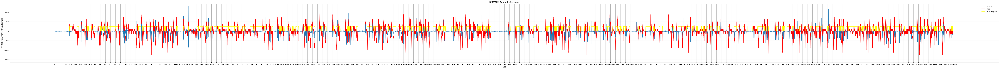

In [49]:
# RPM/ACC Amount of Change's Graph
x = np.arange(0,len(prod[dnum]),60)
plt.figure(figsize=(100,6))
plt.plot(prod[dnum]['RPMS'], label='RPMS')
plt.plot(acc, color='r', label='ACC')
plt.plot(bs, color='yellow', label='BrakeSignal')
plt.title('RPM/ACC Amount of change')      
plt.xlabel('Sec')                       
plt.ylabel(ylabel=['RPM Ratio','ACC','Brake Signal'])                      
plt.xticks(x)                                #
plt.grid(visible=True)
#plt.axhline(y=arpm, color='r', linewidth=1)
plt.legend()
plt.show()

In [ ]:
addf = gdf[0][['car_speed','daily_distance','brake_signal']]
addf['ACC'] = pros[0]['ACC']
addf['daily_distance'] = addf['daily_distance'] - 44

In [17]:
xd = np.arange(0,44,1)

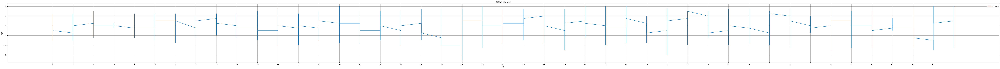

In [18]:
plt.figure(figsize=(100,6))
plt.plot(addf['daily_distance'],addf['ACC'], label='2612')
plt.title('ACC/Distance')            
plt.xlabel('km')                            
plt.ylabel('ACC')                      
plt.xticks(xd)                                
plt.grid(visible=True)
plt.legend()
plt.show()

#### 2-2-2. Data Cluster analysis

#### 2-2-3. RPM Analysis

In [ ]:
# EX) 'for' in list 
#te = [daily[b] for b in range(len(daily))]
# EX) Extract row data 
te = pros[1].loc[pros[0].RPMS < 0,['RPMS']]
te

In [61]:
for o in range(0, len(pros), 1):
    if o == 0:
        adf = pd.DataFrame()
        adf['RPM + ' + str(o+1)] = pros[o].loc[pros[o].RPMS > 0,['RPMS']]
        bdf = pd.DataFrame()
        bdf['RPM - ' + str(o+1)] = pros[o].loc[pros[o].RPMS < 0,['RPMS']]
        adf = adf.reset_index(drop=True)
        bdf = bdf.reset_index(drop=True)
        adf = pd.concat([adf,bdf],axis=1)
    else:
        bdf = pd.DataFrame()
        bdf['RPM + ' + str(o+1)] = pros[o].loc[pros[o].RPMS > 0,['RPMS']]
        cdf = pd.DataFrame()
        cdf['RPM - ' + str(o+1)] = pros[o].loc[pros[o].RPMS < 0,['RPMS']]
        bdf = bdf.reset_index(drop=True)
        cdf = cdf.reset_index(drop=True)
        bdf = pd.concat([bdf,cdf],axis=1)
        adf = pd.concat([adf,bdf],axis=1)  
adf = adf.fillna(0)

In [62]:
adf

,RPM + 1,RPM - 1,RPM + 2,RPM - 2,RPM + 3,RPM - 3,RPM + 4,RPM - 4,RPM + 5,RPM - 5,...,RPM + 10,RPM - 10,RPM + 11,RPM - 11,RPM + 12,RPM - 12,RPM + 13,RPM - 13,RPM + 14,RPM - 14
0,228.0,-57.0,2.5,-56.5,121.5,-26.5,4.5,-2.0,1.5,-53.0,...,65.0,-270.5,6.0,-21.0,26.5,-52.5,5.0,-13.5,2.5,-72.0
1,28.5,-37.5,322.5,-56.0,1.5,-14.5,305.0,-39.5,68.5,-2.5,...,13.0,-101.0,266.0,-64.5,1.0,-23.0,257.5,-52.5,140.5,-8.5
2,40.5,-0.5,4.5,-22.5,3.5,-5.0,11.5,-58.0,189.0,-6.0,...,19.5,-13.0,32.0,-35.0,5.5,-11.0,5.5,-24.5,94.0,-2.5
3,6.0,-3.0,5.0,-8.5,0.5,-7.0,10.5,-30.0,6.0,-2.5,...,130.5,-50.5,1.5,-7.5,7.0,-0.5,4.0,-2.5,19.0,-8.0
4,8.5,-7.5,0.5,-4.0,3.5,-7.5,4.5,-5.0,5.5,-6.5,...,18.5,-99.0,8.0,-4.5,3.5,-0.5,1.5,-2.5,14.0,-12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6647,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6648,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-8.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6649,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-184.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6650,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-37.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [63]:
pmrdf = pd.DataFrame(columns=['date','car_num','MRPM +','MRPM -'])
for num in range(0,int(len(adf.columns)/2),1):
    prm = adf[adf.columns[num*2]].mean()
    mrm = adf[adf.columns[num*2+1]].mean()
    pmrdf.loc[num] = [str(int(pros[0][pros[0].columns[0]][0])),str(int(pros[0][pros[0].columns[1]][0])),prm,mrm]

In [68]:
pmrdf.columns

Index(['date', 'car_num', 'MRPM +', 'MRPM -'], dtype='object')

In [72]:
# Total Daily Plus Mean RPM
tdpmrpm = pmrdf['MRPM +'].mean()
# Total Daily Minus Mean RPM
tdmmrpm = pmrdf['MRPM -'].mean()
print('tdpmrpm : ',tdpmrpm)
print('tdmmrpm : ',tdmmrpm)

tdpmrpm :  26.814771067777684
tdmmrpm :  -26.837685765827676


#### 2-2-4. RPM Normal distribution

In [69]:
npmrdf = pmrdf[['MRPM +','MRPM -']]
npmrdf

,MRPM +,MRPM -
0,23.264808,-23.276909
1,22.786530,-22.789762
2,29.841852,-29.877180
3,27.166266,-27.175661
4,24.250902,-24.262252
5,25.594859,-25.603728
6,28.404991,-28.485568
7,27.682727,-27.690695
8,24.949263,-24.958584
9,26.103879,-26.186034


In [71]:
normalization_npmrdf = (npmrdf - npmrdf.mean())/npmrdf.std()
normalization_npmrdf

,MRPM +,MRPM -
0,-1.498531,1.499248
1,-1.700424,1.704359
2,1.277808,-1.279764
3,0.148375,-0.142303
4,-1.082275,1.084374
5,-0.514956,0.519552
6,0.671273,-0.693833
7,0.366386,-0.359155
8,-0.787479,0.791187
9,-0.300086,0.274375


In [77]:
plusrpm = pd.DataFrame()
plusrpm['DATA'] = npmrdf['MRPM +']
plusrpm['DataType'] = 'MRPM +'
plusrpm

,DATA,DataType
0,23.264808,MRPM +
1,22.786530,MRPM +
2,29.841852,MRPM +
3,27.166266,MRPM +
4,24.250902,MRPM +
5,25.594859,MRPM +
6,28.404991,MRPM +
7,27.682727,MRPM +
8,24.949263,MRPM +
9,26.103879,MRPM +


In [78]:
minusrpm = pd.DataFrame()
minusrpm['DATA'] = npmrdf['MRPM -']
minusrpm['DataType'] = 'MRPM -'
minusrpm

,DATA,DataType
0,-23.276909,MRPM -
1,-22.789762,MRPM -
2,-29.877180,MRPM -
3,-27.175661,MRPM -
4,-24.262252,MRPM -
5,-25.603728,MRPM -
6,-28.485568,MRPM -
7,-27.690695,MRPM -
8,-24.958584,MRPM -
9,-26.186034,MRPM -


In [ ]:
prpm_mean = np.mean(plusrpm['DATA']) #26.81
prpm_std = np.std(plusrpm['DATA'])   #2.28
mrpm_mean = np.mean(minusrpm['DATA'])#-26.83
mrpm_std = np.std(minusrpm['DATA'])  #2.28
#print(prpm_mean,'/',prpm_std,'/',mrpm_mean,'/',mrpm_std)

In [89]:
import scipy.stats as stats
prpm_pdf = stats.norm.pdf(plusrpm['DATA'].sort_values(), prpm_mean, prpm_std)
mrpm_pdf = stats.norm.pdf(minusrpm['DATA'].sort_values(), mrpm_mean, mrpm_std)

array([0.07216572, 0.07255964, 0.10689921, 0.11153584, 0.13450992,
       0.16261705, 0.16814492, 0.17242315, 0.16738882, 0.15073245,
       0.12443597, 0.09254514, 0.051963  , 0.0364781 ])

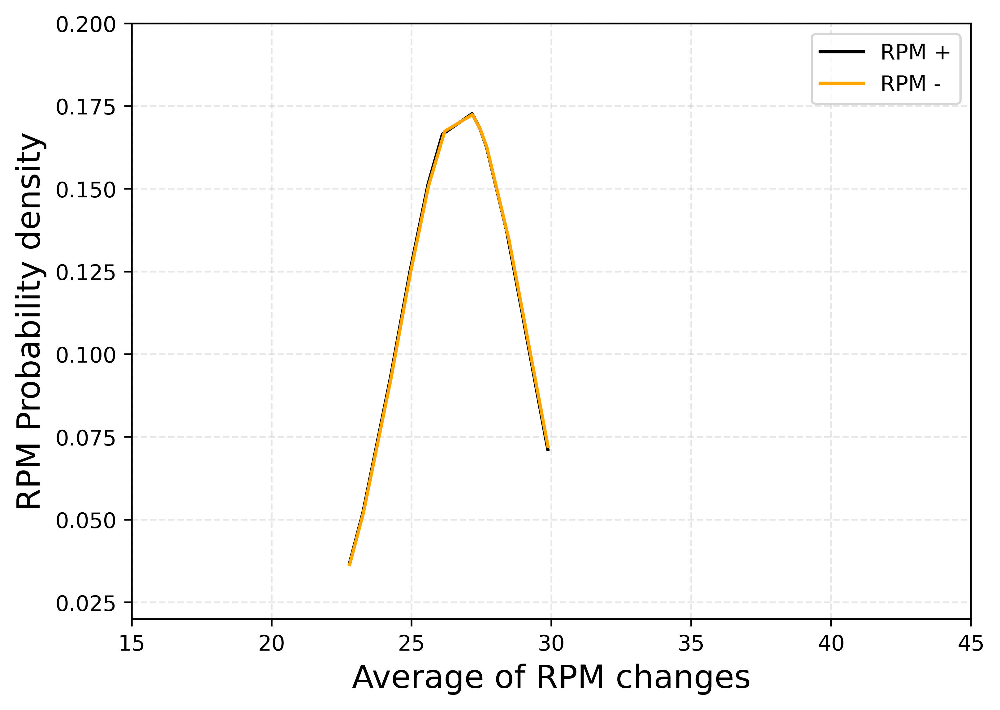

In [93]:
from pylab import rcParams

plt.plot(plusrpm['DATA'].sort_values(), prpm_pdf, color="Black", label="RPM +")
plt.plot((-1*(minusrpm['DATA'].sort_values())), mrpm_pdf, color="Orange", label="RPM -")
plt.xlim([15,45])
plt.ylim([0.02,0.2])
plt.legend()
plt.xlabel("Average of RPM changes", size=15)
plt.ylabel("RPM Probability density", size=15)
plt.grid(True, alpha=0.3, linestyle="--")
plt.rcParams["figure.figsize"] = [7,5]  # 가로, 세로 인치 조정
plt.rcParams["figure.dpi"] = 500   # 해상도 조정
plt.show()

## 3. Driving Uint Data

### 3-1. Driving Unit Data Setting

In [134]:
drivuint = pd.DataFrame(columns=['date',
                         'car_num',
                         'RAC',     #RAC=Rapid ACceleration(급가속)
                         'SDS',     #SDS=Sharp Drop in Speed(급감속)
                         'PRP',     #PRP=Plus RPM(양의 RPM 변화량)
                         'MRP',     #MRP=Minus RPM(음의 RPM 변화량)
                         'FSS',     #FSS=Fest Speed Score
                         'DSR'])    #DSR = Driving Safety Rate(안전운전율)
#drivuint.reset_index(drop=False, inplace=True)                         
drivuint.head()

,date,car_num,RAC,SDS,PRP,MRP,FSS,DSR


In [135]:
# 열 컬럼 조건 갯수 조회
#produ =len(prod[0].loc[prod[0]['RPMSR'] == 0])
fs = 0
nfs = 0
for o in range(0, len(pros), 1):
    count = len(pros[o])
    for s in range(0, count,1):
        if pros[o]['FS'][s] == 1:
            fs = fs + 1
        if fs >= 60:
            nfs = nfs + 1
            fs = 0
    date = pros[o]['date'][0]
    cn = pros[o]['car_num'][0]
    rac = len(pros[o].loc[pros[o]['ACCR'] == 4])
    sds = len(pros[o].loc[pros[o]['ACCR'] == 7])
    prp = len(pros[o].loc[pros[o]['RPMSR'] == 1])
    mrp = len(pros[o].loc[pros[o]['RPMSR'] == 2])
    dsr = (count - (rac + sds + prp + mrp)) / count * 100
    n_df = pd.DataFrame([[date,cn,rac,sds,prp,mrp,nfs,dsr]],columns=['date','car_num','RAC','SDS','PRP','MRP','FSS','DSR'])
    drivuint = pd.concat([drivuint,n_df])



In [138]:
pd.set_option('display.max_rows',None)
drivuint

,date,car_num,RAC,SDS,PRP,MRP,FSS,DSR
0,20221201,9582,49,9,272,222,2,95.861448
0,20221202,9582,46,4,273,210,3,95.260116
0,20221203,9582,156,0,336,199,3,93.922603
0,20221204,9582,145,1,292,174,4,94.257296
0,20221205,9582,70,15,244,223,6,95.565909
0,20221206,9582,35,5,242,186,8,96.170526
0,20221207,9582,42,0,106,49,8,95.904366
0,20221208,9582,4,0,11,35,8,98.111782
0,20221209,9582,149,1,323,218,8,94.250291
0,20221210,9582,37,0,58,42,8,95.671406


In [139]:
p_name = car_name + '.csv'
drivuint.to_csv(p_name,mode='w' ,index=False)

### 3-2. Driving Unit Data Analysis

#### 3-2-1. All Driving Unit Data

In [141]:
dudf = pd.read_csv('../data/drivinfodata_u/DrivingUnitData.csv', encoding='cp949')
dudf.describe()

,date,car_num,RAC,SDS,PRP,MRP,FSS,DSR
count,1.400000e+02,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000
mean,2.022121e+07,6398.700000,84.000000,7.850000,228.200000,185.385714,11.385714,95.375293
std,4.045603e+00,2455.731838,46.806351,13.883858,68.808273,64.319860,8.025665,1.106988
min,2.022120e+07,2612.000000,0.000000,0.000000,3.000000,3.000000,0.000000,92.635000
25%,2.022120e+07,4699.000000,41.750000,1.000000,192.000000,155.000000,5.000000,94.517750
50%,2.022121e+07,5427.500000,85.500000,4.000000,240.000000,176.500000,9.500000,95.331000
75%,2.022121e+07,9007.000000,117.500000,8.250000,269.750000,214.000000,16.250000,96.083500
max,2.022121e+07,9582.000000,205.000000,119.000000,481.000000,374.000000,41.000000,99.943000


In [142]:
dudf['URAC'] = np.where(dudf['RAC'] >= dudf['RAC'].mean(),1,0) # 평균 급가속 횟수 보다 높은 경우
dudf['USDS'] = np.where(dudf['SDS'] >= dudf['SDS'].mean(),1,0) # 평균 급감속 횟수 보다 높은 경우
dudf['UPRP'] = np.where(dudf['PRP'] >= dudf['PRP'].mean(),1,0) # 평균 +RPM 횟수 보다 높은 경우
dudf['UMRP'] = np.where(dudf['MRP'] >= dudf['MRP'].mean(),1,0) # 평균 -RPM 횟수 보다 높은 경우
dudf['UFSS'] = np.where(dudf['FSS'] >= dudf['FSS'].mean(),1,0) # 평균 과속 횟수 보다 높은 경우
dudf['DURS'] = dudf['UFSS'] + dudf['URAC'] + dudf['USDS']
dudf['VURS'] = dudf['UPRP'] + dudf['UMRP']

In [ ]:
dudf.to_csv('DrivingUnitData.csv',index=False,encoding='utf-8-sig')


In [167]:
dudf.columns

Index(['date', 'car_num', 'RAC', 'SDS', 'PRP', 'MRP', 'FSS', 'DSR', 'URAC',
       'USDS', 'UPRP', 'UMRP', 'UFSS', 'DURS', 'VURS'],
      dtype='object')

In [152]:
x = np.arange(1,len(dudf)+1,1)

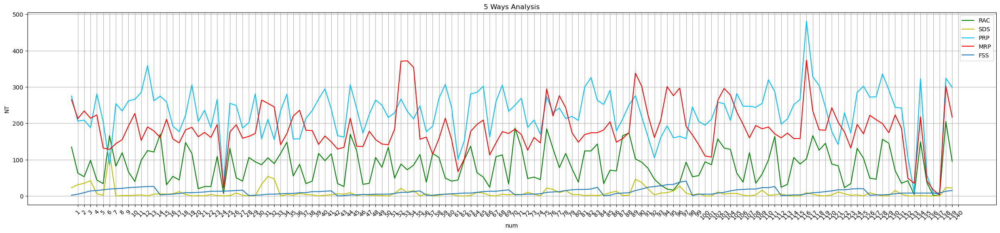

In [153]:
plt.figure(figsize=(30,6))
plt.plot(dudf['RAC'], label='RAC', color='Green')
plt.plot(dudf['SDS'], label='SDS', color='y')
plt.plot(dudf['PRP'], label='PRP', color='deepskyblue')
plt.plot(dudf['MRP'], label='MRP', color='r')
plt.plot(dudf['FSS'], label='FSS')        
plt.title('5 Ways Analysis')            
plt.xlabel('num')                            
plt.ylabel('NT')                      
plt.xticks(x, rotation=45)                                
plt.grid(visible=True)
plt.legend()
plt.show()

#### 3-2-2. Individual Driving Unit Data

In [2]:
vehidire = '../data/drivinfodata_u/'
vehi_list = os.listdir(vehidire)
vehi_list

['2612.csv',
 '3897.csv',
 '4699.csv',
 '4985.csv',
 '5221.csv',
 '5634.csv',
 '8993.csv',
 '9007.csv',
 '9357.csv',
 '9582.csv',
 'DrivingUnitData_u.csv']

In [3]:
vehidf = []
for vh in vehi_list[:9]:
    vehidf.append(pd.read_csv(vehidire+vh,encoding='cp949'))


In [10]:
ndf = 3
car = vehi_list[ndf][:-4]
vehidf[ndf]

,date,car_num,RAC,SDS,PRP,MRP,FSS,DSR
0,20221201,4985,34,6,166,129,0,97.157
1,20221202,4985,26,5,162,134,1,96.876
2,20221203,4985,170,9,306,214,3,93.563
3,20221204,4985,125,1,241,137,3,95.256
4,20221205,4985,32,4,173,136,4,97.351
5,20221206,4985,35,2,225,178,4,96.031
6,20221207,4985,106,2,264,155,5,95.365
7,20221208,4985,79,1,250,143,5,95.939
8,20221209,4985,134,0,216,141,5,94.715
9,20221210,4985,49,7,229,184,7,95.850


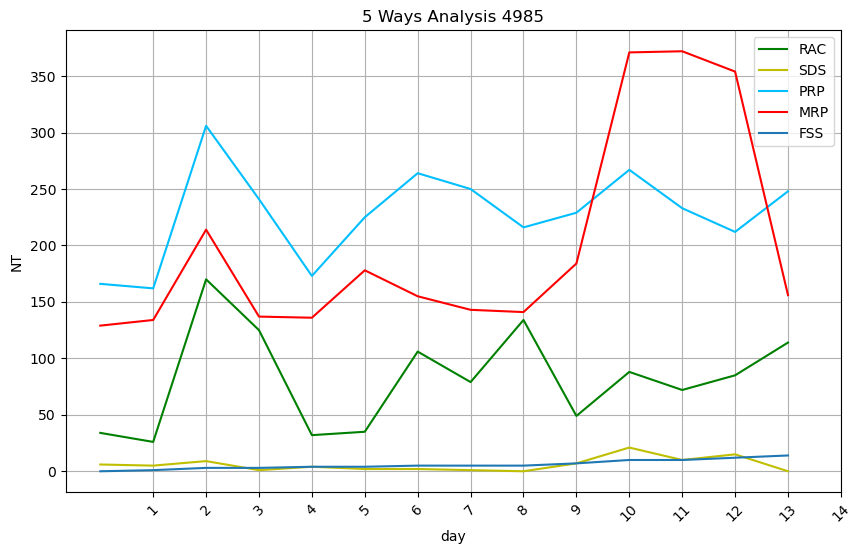

In [11]:

plt.figure(figsize=(10,6))
x=np.arange(1,15,1)
plt.plot(vehidf[ndf]['RAC'], label='RAC', color='Green')       #RAC=Rapid ACceleration(급가속)
plt.plot(vehidf[ndf]['SDS'], label='SDS', color='y')           #SDS=Sharp Drop in Speed(급감속)
plt.plot(vehidf[ndf]['PRP'], label='PRP', color='deepskyblue') #PRP=Plus RPM(양의 RPM 변화량)
plt.plot(vehidf[ndf]['MRP'], label='MRP', color='r')           #MRP=Minus RPM(음의 RPM 변화량)
plt.plot(vehidf[ndf]['FSS'], label='FSS')                      #FSS=Fest Speed Score(과속)
plt.title('5 Ways Analysis ' + car)            
plt.xlabel('day')                            
plt.ylabel('NT')                      
plt.xticks(x, rotation=45)                                
plt.grid(visible=True)
plt.legend()
plt.show()


In [168]:
racmean = dudf['RAC'].mean()
sdsmean = dudf['SDS'].mean()
prpmean = dudf['PRP'].mean()
mrpmean = dudf['MRP'].mean()
fssmean = dudf['FSS'].mean()
racsum = dudf['RAC'].sum()
sdssum = dudf['SDS'].sum()
prpsum = dudf['PRP'].sum()
mrpsum = dudf['MRP'].sum()
fsssum = dudf['FSS'].sum()

In [173]:
drivstats = pd.DataFrame({'car_num':['ALL'],
                         'RACM':[int(racmean)],     #RAC=Rapid ACceleration(급가속)
                         'SDSM':[int(sdsmean)],     #SDS=Sharp Drop in Speed(급감속)
                         'PRPM':[int(prpmean)],     #PRP=Plus RPM(양의 RPM 변화량)
                         'MRPM':[int(mrpmean)],     #MRP=Minus RPM(음의 RPM 변화량)
                         'FSSM':[int(fssmean)],     #FSS=Fest Speed Score
                         'RACS':[racsum],     
                         'SDSS':[sdssum],     
                         'PRPS':[prpsum],     
                         'MRPS':[mrpsum],     
                         'FSSS':[fsssum]})    
drivstats

,car_num,RACM,SDSM,PRPM,MRPM,FSSM,RACS,SDSS,PRPS,MRPS,FSSS
0,ALL,84,7,228,185,11,11760,1099,31948,25954,1594


In [174]:

for o in range(0, len(vehidf), 1):
    carn = vehidf[o]['car_num'][0]
    racm = int(vehidf[o]['RAC'].mean())
    sdsm = int(vehidf[o]['SDS'].mean())
    prpm = int(vehidf[o]['PRP'].mean())
    mrpm = int(vehidf[o]['MRP'].mean())
    fssm = int(vehidf[o]['FSS'].mean())
    racs = vehidf[o]['RAC'].sum()
    sdss = vehidf[o]['SDS'].sum()
    prps = vehidf[o]['PRP'].sum()
    mrps = vehidf[o]['MRP'].sum()
    fsss = vehidf[o]['FSS'].sum()
    i_df = pd.DataFrame([[carn,racm,sdsm,prpm,mrpm,fssm,racs,sdss,prps,mrps,fsss]],
                        columns=['car_num','RACM','SDSM','PRPM','MRPM','FSSM','RACS','SDSS','PRPS','MRPS','FSSS'])
    # drivuint.append(,ignore_index=True)
    drivstats = pd.concat([drivstats,i_df])

In [175]:
drivstats.to_csv('Drivstats.csv',mode='w' ,index=False)

In [176]:
#RAC=Rapid ACceleration(급가속)
#SDS=Sharp Drop in Speed(급감속)
#PRP=Plus RPM(양의 RPM 변화량)
#MRP=Minus RPM(음의 RPM 변화량)
#FSS=Fest Speed Score
dristats = pd.read_csv('./Drivstats.csv',encoding='cp949')
dristats

,car_num,RACM,SDSM,PRPM,MRPM,FSSM,RACS,SDSS,PRPS,MRPS,FSSS
0,ALL,84,7,228,185,11,11760,1099,31948,25954,1594
1,2612,88,19,240,189,17,1244,270,3371,2650,246
2,3897,69,3,217,163,10,973,50,3046,2295,142
3,4699,92,11,220,191,7,1292,159,3085,2686,105
4,4985,82,5,228,200,5,1149,83,3192,2804,83
5,5221,73,3,233,154,8,1026,46,3269,2165,122
6,5634,105,7,240,189,11,1479,99,3361,2659,167
7,8993,73,14,198,226,20,1026,200,2782,3165,281
8,9007,91,4,247,192,13,1284,65,3458,2691,193
9,9357,89,3,256,195,10,1252,47,3592,2742,153


## 4. Vehicle Information Data

### 4-1. Vehicle Information DataFrame Setting

In [53]:
vehinfo = pd.DataFrame({'car_num':['2612','3897','4699','4985','5221','5634','8993','9007','9357','9582'],
                        'car_type':[11,11,11,11,11,11,11,11,11,11],
                        'DRS':[2,1,2,1,1,2,2,1,1,0],                     #DRS=Driving Risk Score
                        'VRS':[2,0,0,1,2,0,0,2,1,2],                     #VRS=Vehicle Risk Score
                        'TS':[4,1,2,2,3,2,2,3,2,2],                      #TS=Total Score
                        'Judgment':['즉시점검','이상없음','주의','주의','위험','주의','주의','위험','주의','주의']})
                        #Judgment(안전 - 0, 이상없음 - 1, 주의 - 2, 위험 - 3, 즉시점검 - 4)     
vehinfo

,car_num,car_type,DRS,VRS,TS,Judgment
0,2612,11,2,2,4,즉시점검
1,3897,11,1,0,1,이상없음
2,4699,11,2,0,2,주의
3,4985,11,1,1,2,주의
4,5221,11,1,2,3,위험
5,5634,11,2,0,2,주의
6,8993,11,2,0,2,주의
7,9007,11,1,2,3,위험
8,9357,11,1,1,2,주의
9,9582,11,0,2,2,주의


In [56]:
#CSV 파일 변환
vehinfo.to_csv('VehInfoData.csv',index=False,encoding='utf-8-sig')


In [ ]:
#인덱스 변환
#vehinfo1 = vehinfo.set_index('car_num')
#vehinfo1

In [61]:
num = 0
for i in range(0,10081,1):
    if prodata['FS'][i] == 1:
        num = num + 1
    if num == 60:
        vehinfo['FSS'][0] = vehinfo['FSS'][0] + 1

vehinfo.head()

C:\Users\user\AppData\Local\Temp\ipykernel_9556\326237630.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehinfo['FSS'][0] = vehinfo['FSS'][0] + 1


,car_num,car_type,FSS,DRS,VRS,TS,Judgment
0,부산70자1894,11,3,0,0,0,
1,부산70자1860,11,0,0,0,0,
